# Czym jest styl wystroju wnętrz?

https://www.researchgate.net/publication/353210781_INTERIOR_DESIGNING_INTRODUCTION_TO_INTERIOR_A_SHORT_DOCUMENT_-_BASIC_DESCRIPTIONS_OF_THE_COMPONENTS_OF_INTERIOR_DESIGNING




# Problemy z określeniem jakie style są popularne.

- Brak publikacji naukowych/raportów z wystrojów wnętrz w Europie i w Polsce, konieczne jest posiłkowanie się pośrednimi lub nienaukowymi źródłami.
- Jedna cecha może określać wiele styli, np. minimalizm określa styl skandynawski i modernistyczny, naturalne nieobrobione drewno określa Wabi Sabi, ekologoczny i rustykalny styl. Większość styli używa jasnych barw itd..

# Style w Europie

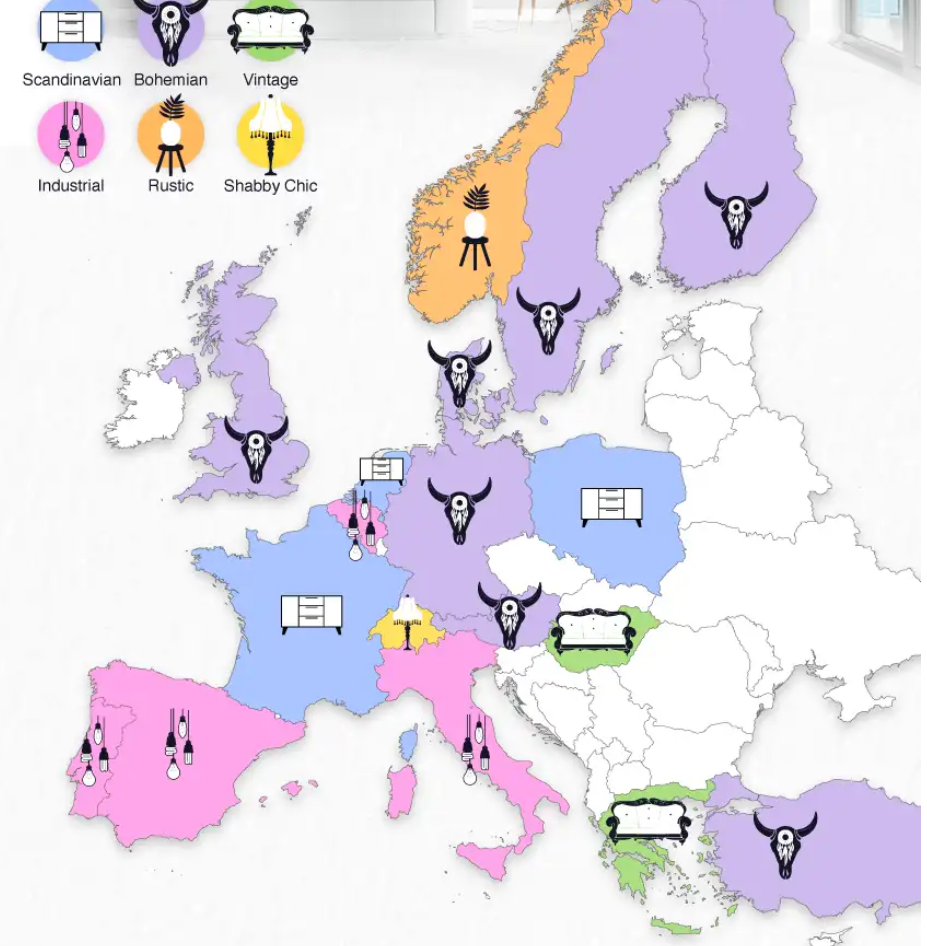

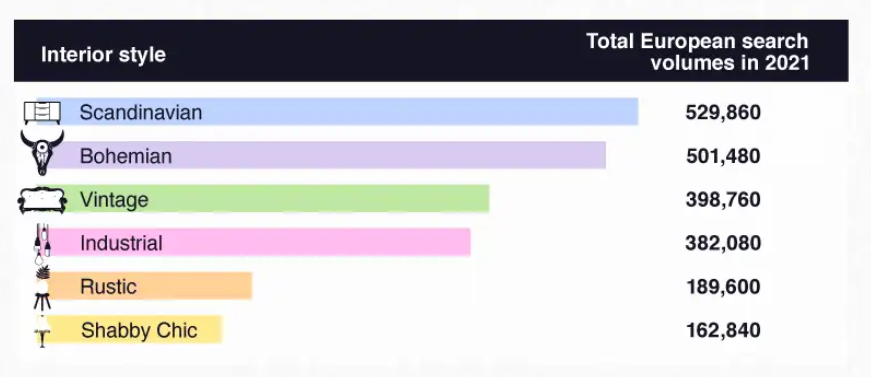

SRC: https://www.uswitch.com/mortgages/guides/most-popular-interior-trends-across-europe/

Metodologia:
15 najpopularniejszych styli na Pinterest -> sprawdzenie ilości zapytań w Google Trends -> 6 najpopularniejsych styli

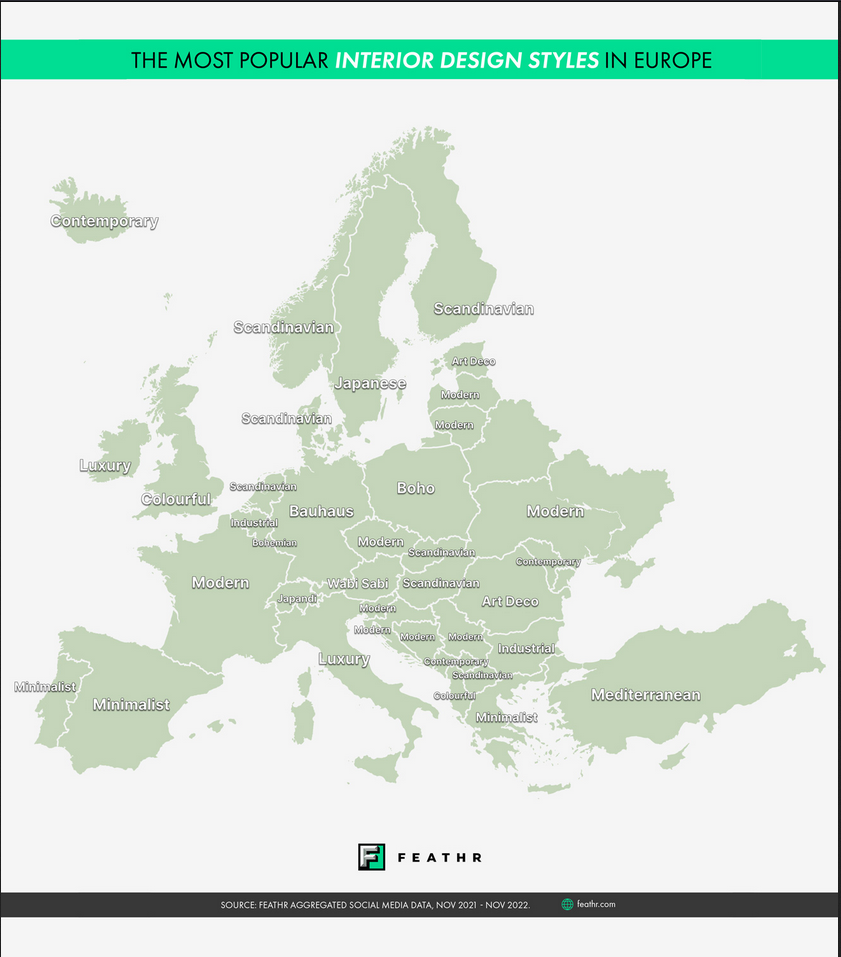

SRC: https://feathr.com/interior-design-styles-europe-infographic



# Style w Polsce

https://mojeprojektowanie.pl/style-we-wnetrzach-w-jakim-stylu-mieszkanie/

### Popularne i unikalne style

Wybrane style na podstawie popularności i unikalności:
- skandynawski - Praktyczna funkcjonalność, minimalistyczny ale jednocześnie przyjazny nastrój. Wg. Ikei styl opiera się na: prostoscie, funkcjonalności i pięknie. Jasne kolory. <br>
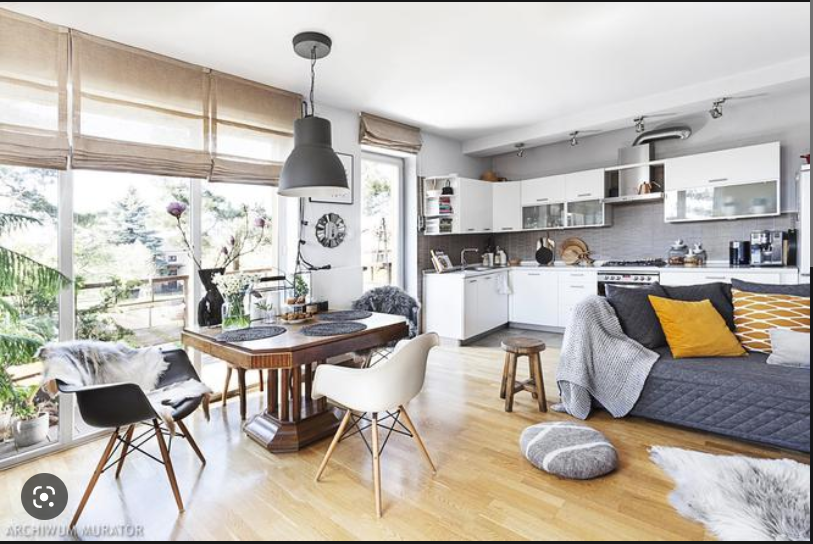

- bohemian (boho) - Często inspirowany brakiem struktury, jest połączeniem beztroskich wzorów, faktur i kolorów. Styl boho opiera się na osobistej ekspresji i braku zasad. Różnorodne tkaniny, naturalność materiałów i etniczne wzory, wzorzyste dywany i frędzle. <br>
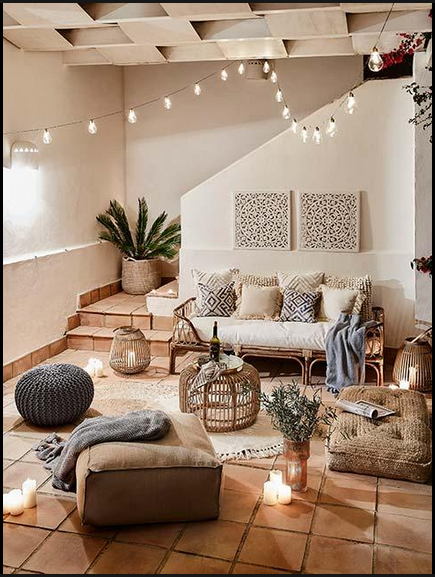

- glamour - Żywa kolorystyka, dużo światła, duża ilość kryształowych i puchowych dodatków. Złote i srebrrne akcenty dekoracyjne. <br>
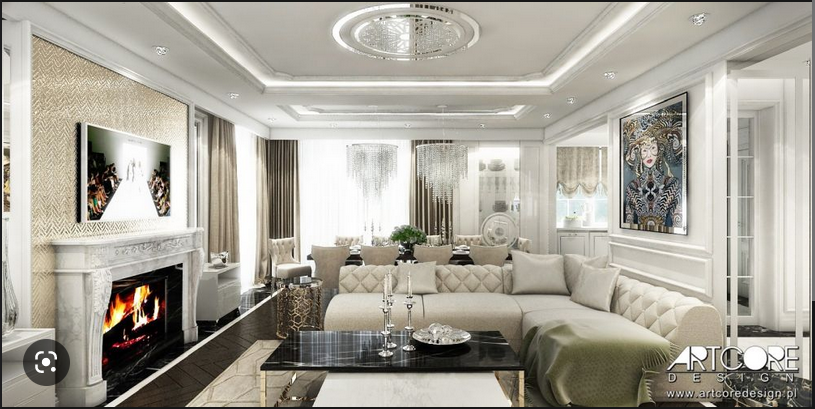

- vintage - Bazuje na dekorowaniu wystroju za pomocą mebli, akcesorii i palety kolorów z wcześniejszych okresów. <br>
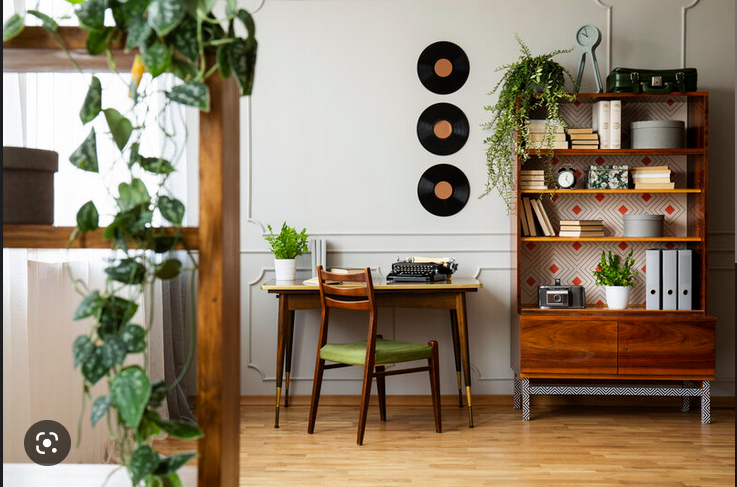

- rustykalny - Styl podkreśla naturalne, surowe piękno ze swobodnym i starym klimatem. Kojarzony jest przede wszystkim z wiejskim domem, sielskim klimatem, drewnianymi meblami czy naturalnymi tkaninami. Niekoniecznie duże przestrzenie. <br>
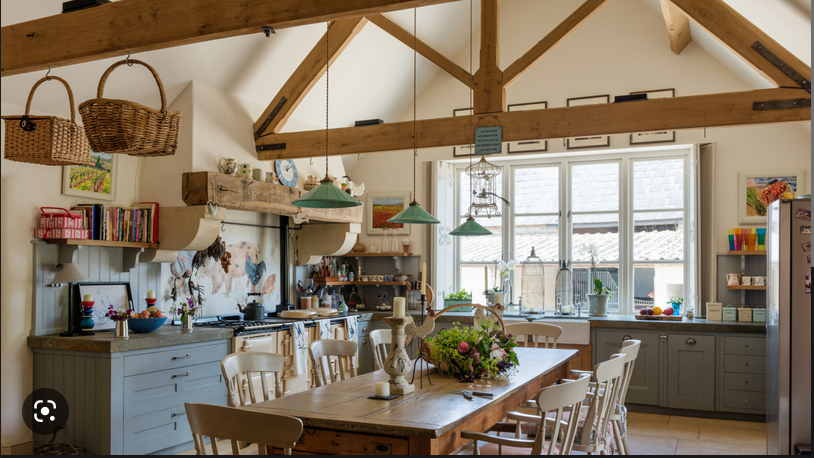

- prowansalski - Jasny, dużo bieli, sporo fioletu. Dominuje drewno, kształty mebli opływowe i lekkie. <br>
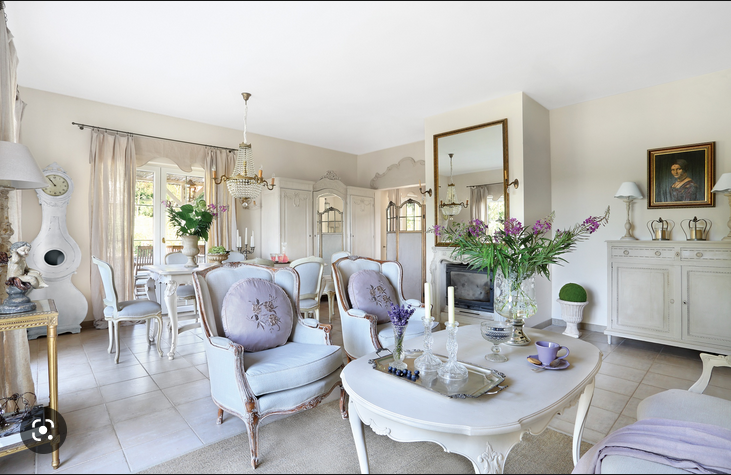

- angielski - Mieszanka stylu wiktoriańskiego i wiejskiego. <br>
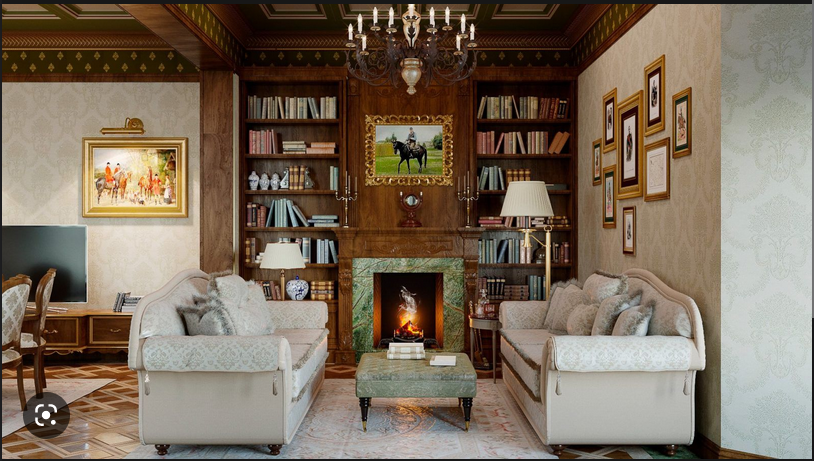

- industrialny/loftowy - Zwykle definiowany przez przestrzeń, przemysłowy styl integruje materiały budowlane do wystroju. Proste meble<br>
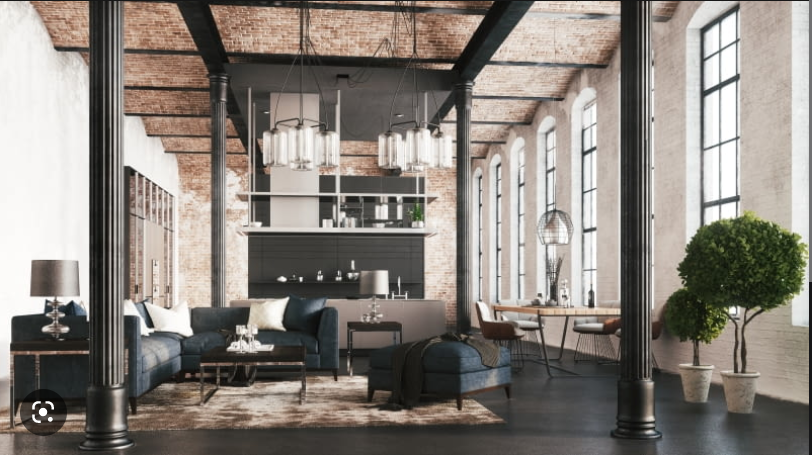

- hampton - Przytłumione kolory, naturalne materiały. Proste, klasyczne formy. Miękkie linie, symetria, wszechobecne światło i przestrzeń. <br>
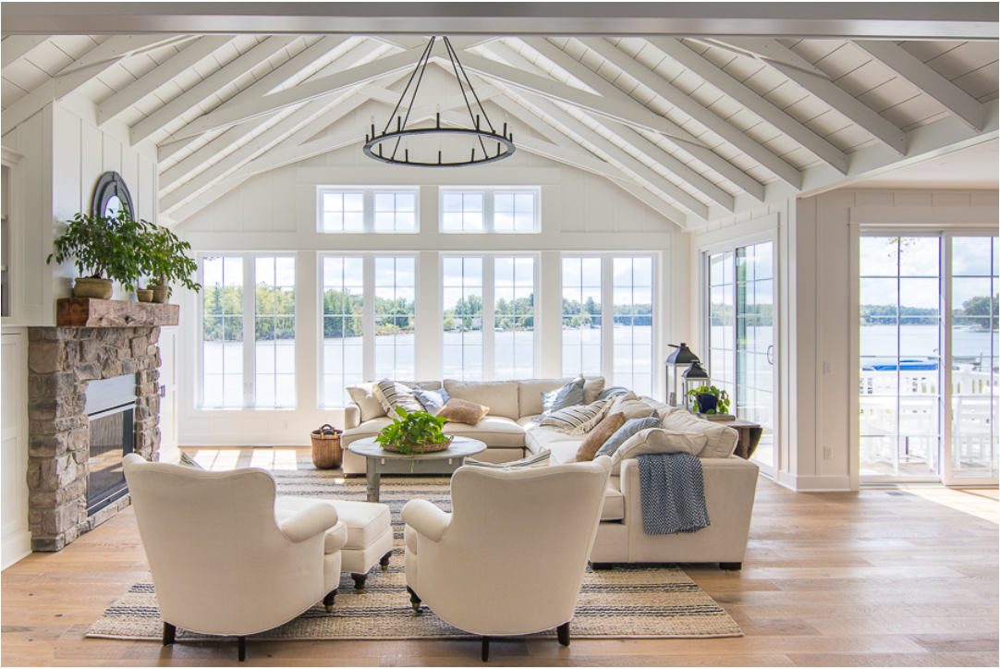

- nowojorski - Przestronny. Dużo drewna i niklu. Dużo źródeł światła. Biel i szarość <br>
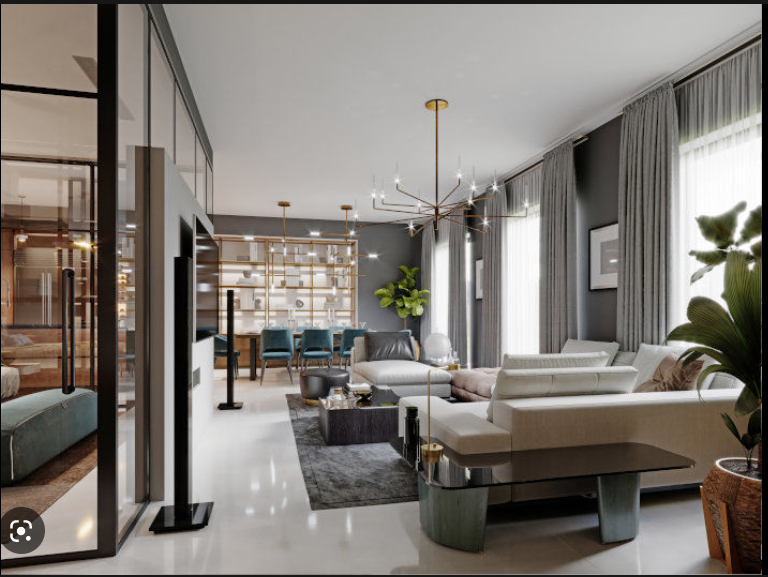

- nowoczesny - Otwarta przestrzeń, jasne. Biel, czerń, szarość i beż. Stonowany, unika się intensywnych kolorów. Proste wzory geometryczne. Nie powinno być zbyt wielu dekoracji. <br>
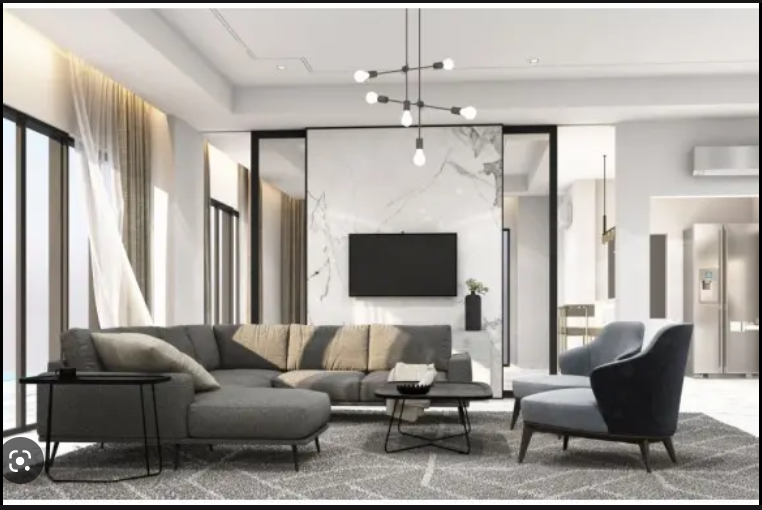

- art deco - Piękno przedmiotów codziennego użytku. Funkcjonalność. Różne kolory. Wysoka jakość. Elegancja. <br>
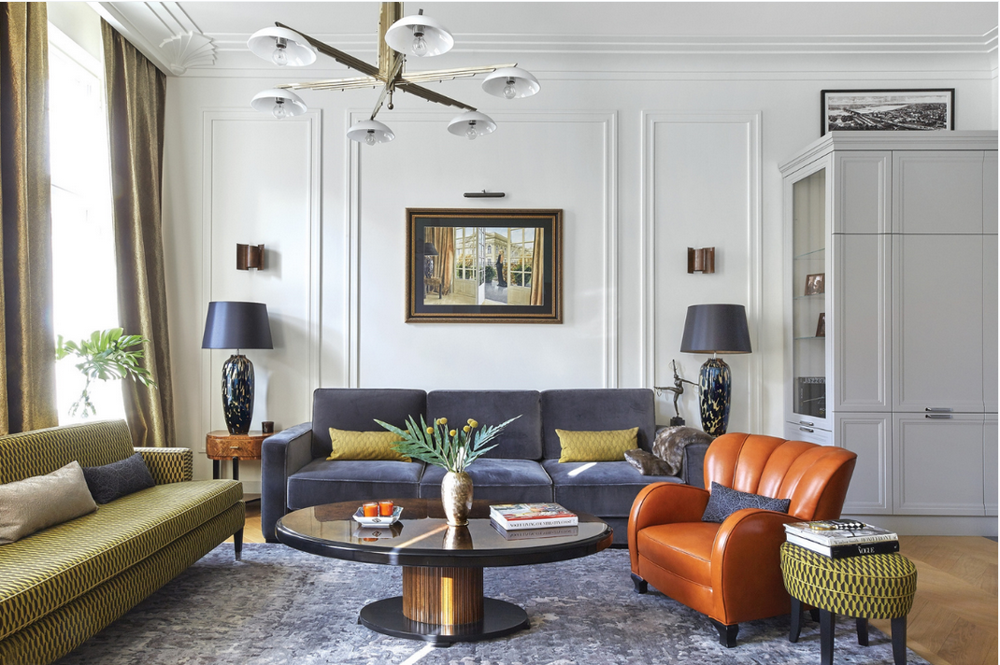

- eko - Harmonia i spokój kompozycji. Stonowane kolory i zieleń. Roślinność. Naturalne materiały. <br>
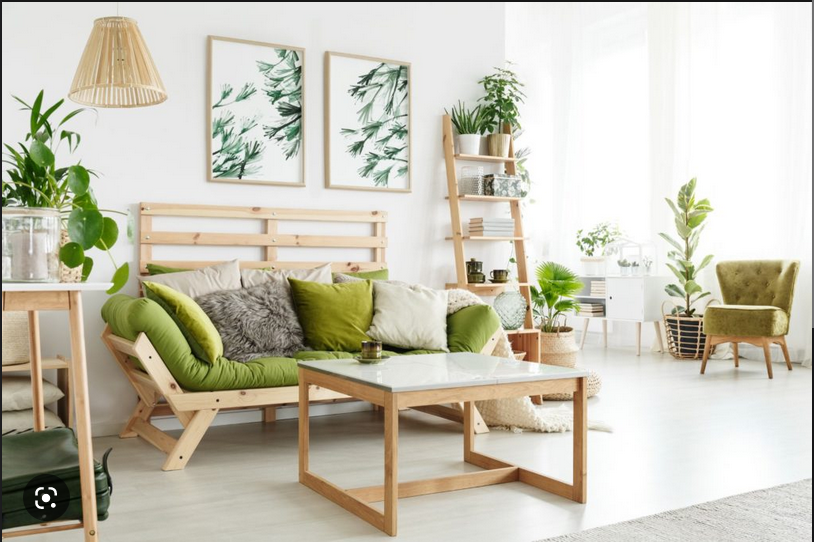

### Style regionalne
https://www.dekoria.pl/blog/zainspiruj-sie-podrozami-po-polsce-aranzujemy-regionalne-wnetrza/

- styl PRL - Duża ilość drewna. Podłoga drewniana we wzory lub limoneum. Boazeria. <br>
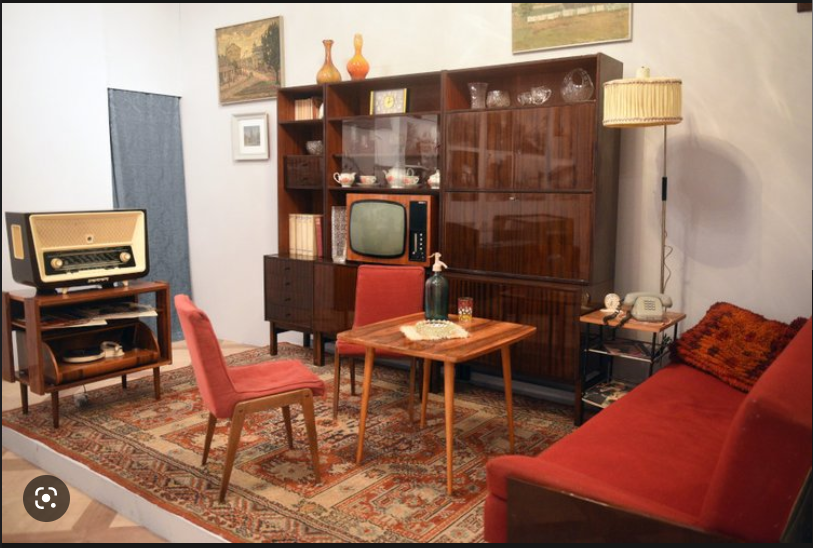

- styl zakopiański (górski) - Naturalność z nutką artyzmu. Inspiracje sztuką ludową. Duże przestrzenie. Przede wszystkim drewno, brak tkanin i dywanów.<br>
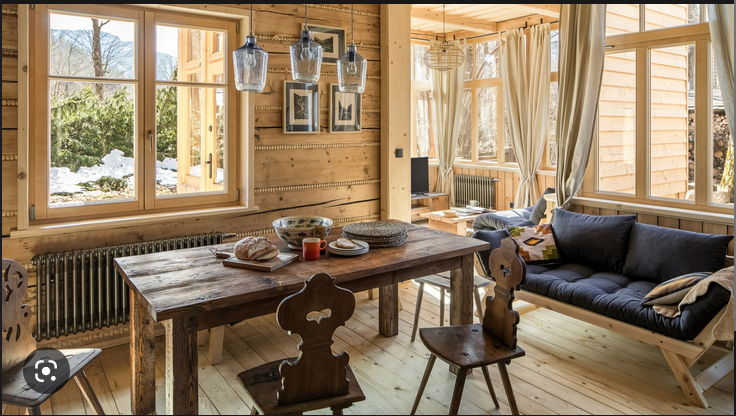

- marynistyczny (mocno naciągane jako styl regionalny) - Biel i niebieski. Odcienie piaskowe. Dekoracje marynistyczne. <br>
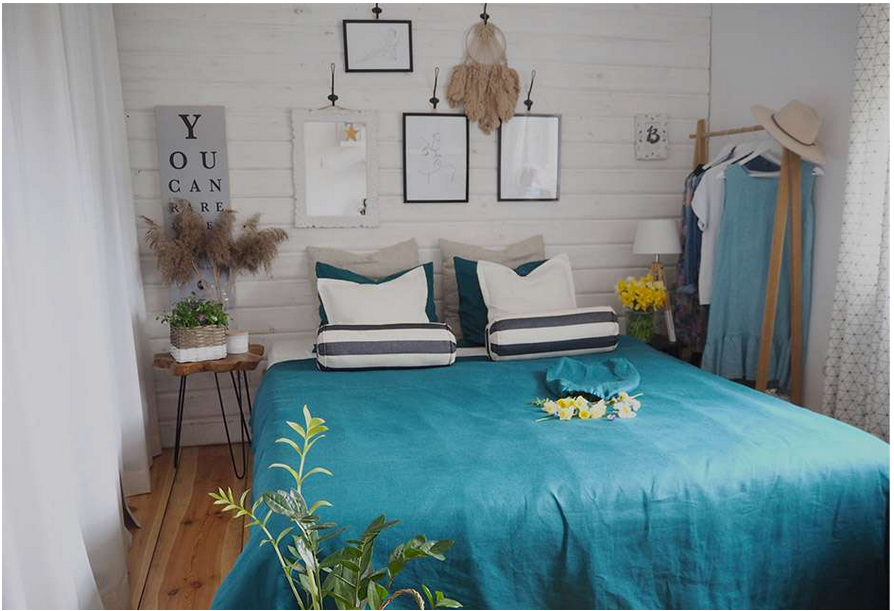

- folklor łowicki, krakowski (fajne ale nikt nie ma takiego mieszkania) - Wzory łowickie<br>
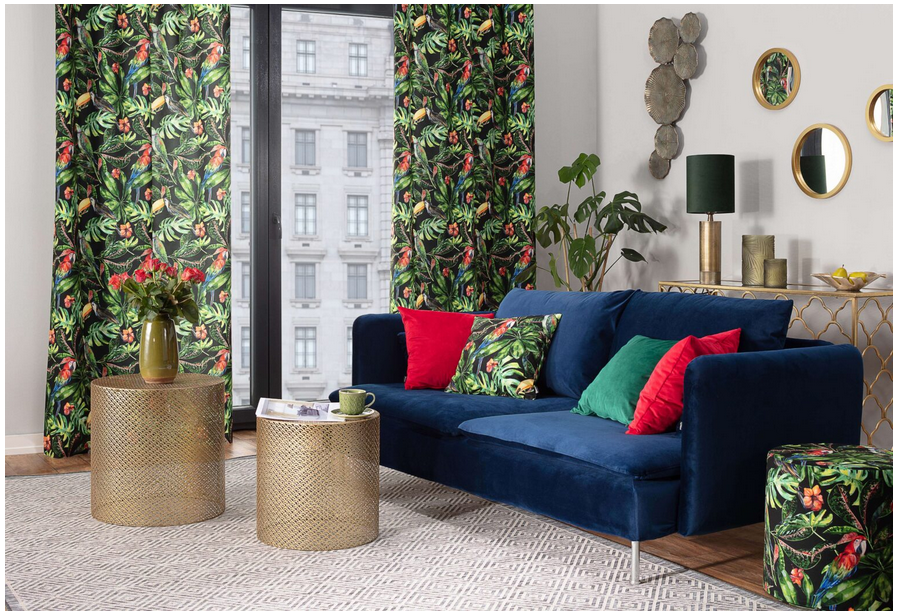

- styl dworkowy - Naturalne i neutralne kolory. Brak przepychu. Historyczne i rodzinne dodatki.<br>
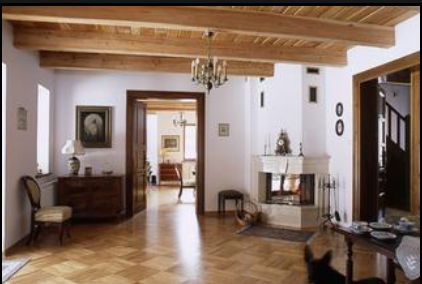

# Analzia zapytań na Google Trends (Polska)

In [108]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import plotly.express as px

from collections import OrderedDict
from operator import getitem

In [39]:
styles_dict = {}

for filename in os.listdir('data/google_trends'):
    f = os.path.join('data/google_trends', filename)
    
    if filename[-13:] == '_timeline.csv':
        styles_dict[filename[:-13]] = {
            'timeline': pd.read_csv(f'data/google_trends/{filename[:-13]}_timeline.csv', skiprows=[0, 1]),
            'map': pd.read_csv(f'data/google_trends/{filename[:-13]}_map.csv', skiprows=[0, 1]),
            'queries_sum': pd.read_csv(f'data/google_trends/{filename[:-13]}_timeline.csv', skiprows=[0, 1]).iloc[:,1].sum()
        }

# Merge 'loftowy' and 'industrialny'?

In [57]:
styles_dict_sorted = OrderedDict(sorted(styles_dict.items(), key = lambda x: getitem(x[1], 'queries_sum'), reverse=True))

In [106]:
x, y = zip(*[(k, v['queries_sum']) for (k, v) in styles_dict_sorted.items()])

fig = px.bar(pd.DataFrame({'style': x, 'queries_sum': y}), x='style', y='queries_sum')
fig.show()